In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import anndata as ad
import scanpy.external as sce
import decoupler as dc
import scanorama
import squidpy as sq
import numpy as np
import tacco as tc
import re

In [2]:
adata_visium=ad.read_h5ad("./results_harm.h5ad")

In [3]:
adata_sc=ad.read_h5ad("./scRNA/MCA2.0_Fig1_adata.h5ad")

In [4]:
csv_data = pd.read_csv("./scRNA/MCA2.0_cell_info.csv", index_col=0, sep=";")

In [5]:
for column in csv_data.columns:
    adata_sc.obs[column] = csv_data[column]

In [6]:
adata_scpanc = adata_sc[adata_sc.obs.index.str.contains("AdultPancreas", na=False)].copy()

In [7]:
adata_scpanc.write_h5ad('scRNA_MCA2_panconly.h5ad')

In [8]:
adata_sc=ad.read_h5ad("./scRNA_MCA2_panconly.h5ad")

In [9]:
value_to_remove="Undefined (Adult-Pancreas)"
column_name="Tissue_annotation"
adata_sc=adata_sc[adata_sc.obs[column_name] != value_to_remove]

In [10]:
adata_visium.X = adata_visium.layers["counts"].copy()

In [11]:
tc.tl.annotate(adata_visium, adata_sc, "Main_annotation", result_key="sc_anno", counts_location=("X"))

Starting preprocessing
Annotation profiles were not found in `reference.varm["Main_annotation"]`. Constructing reference profiles with `tacco.preprocessing.construct_reference_profiles` and default arguments...


C:\Users\thmet\miniconda3\envs\thomas\Lib\site-packages\tacco\preprocessing\_reference.py:112: ImplicitModificationWarning: Setting element `.varm['Main_annotation']` of view, initializing view as actual.
  adata.varm[annotation_key] = profiles.reindex(index=adata.var.index)


Finished preprocessing in 7.33 seconds.
Starting annotation of data with shape (13966, 13859) and a reference of shape (2842, 13859) using the following wrapped method:
+- platform normalization: platform_iterations=0, gene_keys=Main_annotation, normalize_to=adata
   +- multi center: multi_center=None multi_center_amplitudes=True
      +- bisection boost: bisections=4, bisection_divisor=3
         +- core: method=OT annotation_prior=None
mean,std( rescaling(gene) )  88.80925274774684 678.687047555276
bisection run on 1
bisection run on 0.6666666666666667
bisection run on 0.4444444444444444
bisection run on 0.2962962962962963
bisection run on 0.19753086419753085
bisection run on 0.09876543209876543
Finished annotation in 21.24 seconds.


AnnData object with n_obs × n_vars = 13966 × 19465
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'anno_TM', 'n_counts', 'dataset', 'clusters'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'anno_TM_colors', 'clusters', 'clusters_colors', 'dataset_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial', 'sc_anno'
    varm: 'PCs', 'sc_anno'
    layers: 'counts', 'normalized'
    obsp: 'connectivities', 'distances'

In [12]:
adata_visium.obsm["sc_anno"].to_csv("./scRNA_TACCO_MCA2_panconly_Mainanno.csv")

In [13]:
df_obs = pd.read_csv("./results_clusters_anno_dataset_harm.csv", sep=",", index_col="Unnamed: 0")
df_obsm = pd.read_csv("./scRNA_TACCO_MCA2_panconly_Mainanno.csv", sep=",", index_col="Unnamed: 0")
df = pd.concat([df_obs, df_obsm], axis=1)
df2 = df.rename(columns={"Epithelial cell": "Ductal cell"})
df2 = df2.drop(df2.columns[[0,2]], axis=1)

In [14]:
averages = df2.groupby('anno_TM').mean() *100
averages = averages[averages > 5]
rest = 100 - averages.sum(axis=1)
rest=rest.reset_index()
rest=rest.set_index("anno_TM")
averages=pd.concat([averages, rest], axis=1)
custom_order = ['Azini normal', 'ADM Early', 'ADM Full', 'ADM MTC', "mPanIN", "Duct normal", "Islets", 'Stroma', 'Fat', 'Immune cells', 'Blood vessels',]
averages = averages.reindex(custom_order)
averages = averages.dropna(axis=1, how="all")
averages.rename(columns={averages.columns[-1]: 'Rest'}, inplace=True)

In [15]:
av_acinar = averages.iloc[:4]
av_rest = averages.iloc[4:]

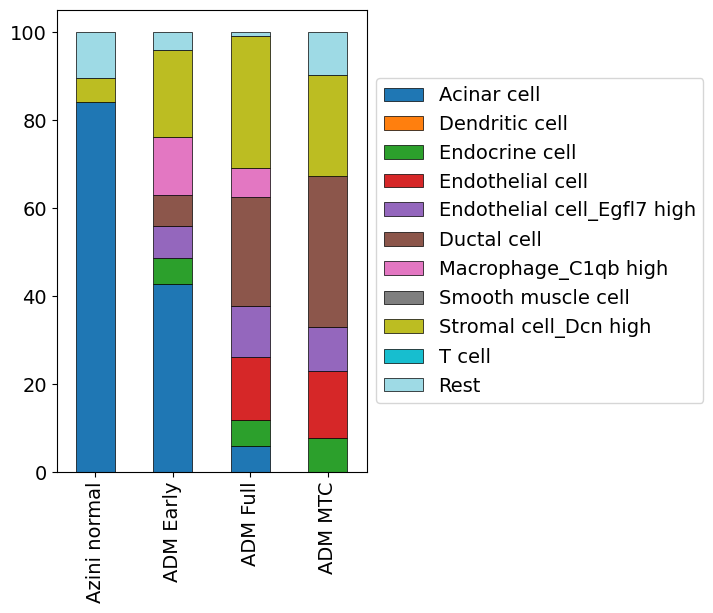

In [16]:
fig, ax = plt.subplots(1,1, figsize=(4,6))
av_acinar.plot(kind="bar", stacked=True, ax=ax, edgecolor='black', linewidth=0.5, xlabel="", grid=False, colormap="tab20") #, color=([0.12156863, 0.46666667, 0.70588235, 1.        ],[1.         ,0.49803922 ,0.05490196 ,1.        ],[0.17254902, 0.62745098, 0.17254902, 1.        ],[0.83921569, 0.15294118, 0.15686275, 1.        ],[0.58039216, 0.40392157, 0.74117647, 1.        ],[0.54901961, 0.3372549 , 0.29411765, 1.        ] ,[0.89019608 ,0.46666667 ,0.76078431 ,1.        ],[0.7372549  ,0.74117647, 0.13333333 ,1.        ],[0.09019608, 0.74509804, 0.81176471, 1.        ],[0.68235294, 0.78039216, 0.90980392, 1.        ] ,[1.         ,0.73333333, 0.47058824 ,1.        ] ,[0.59607843, 0.8745098,  0.54117647, 1.        ], [1.        , 0.59607843, 0.58823529 ,1.        ],[0.77254902, 0.69019608, 0.83529412 ,1.        ] ,[0.76862745, 0.61176471, 0.58039216 ,1.        ],[0.96862745 ,0.71372549 ,0.82352941, 1.        ],[0.78039216 ,0.78039216 ,0.78039216 ,1.        ] ,[0.85882353, 0.85882353, 0.55294118, 1.        ], [0.61960784, 0.85490196 ,0.89803922 ,1.        ]))
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=14)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)
plt.savefig("./scRNA_TACCO_Mainanno_av_acinar.pdf", bbox_inches="tight")
plt.savefig("./scRNA_TACCO_Mainanno_av_acinar.tiff", bbox_inches="tight")
plt.show()

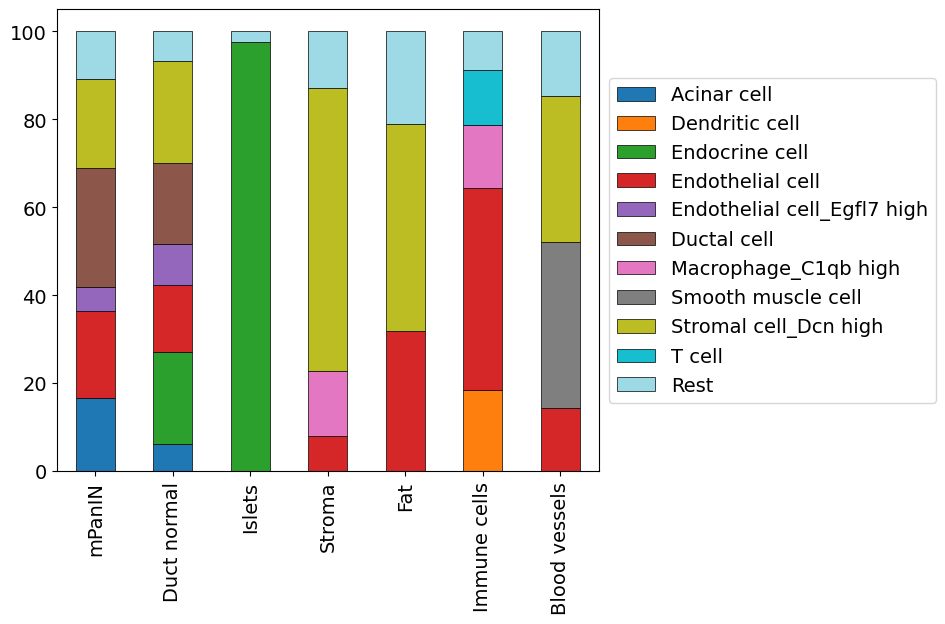

In [17]:
fig, ax = plt.subplots(1,1, figsize=(7,6))
av_rest.plot(kind="bar", stacked=True, ax=ax, edgecolor='black', linewidth=0.5, xlabel="", grid=False, colormap="tab20") #, color=([0.12156863, 0.46666667, 0.70588235, 1.        ],[1.         ,0.49803922 ,0.05490196 ,1.        ],[0.17254902, 0.62745098, 0.17254902, 1.        ],[0.83921569, 0.15294118, 0.15686275, 1.        ],[0.58039216, 0.40392157, 0.74117647, 1.        ],[0.54901961, 0.3372549 , 0.29411765, 1.        ] ,[0.89019608 ,0.46666667 ,0.76078431 ,1.        ],[0.7372549  ,0.74117647, 0.13333333 ,1.        ],[0.09019608, 0.74509804, 0.81176471, 1.        ],[0.68235294, 0.78039216, 0.90980392, 1.        ] ,[1.         ,0.73333333, 0.47058824 ,1.        ] ,[0.59607843, 0.8745098,  0.54117647, 1.        ], [1.        , 0.59607843, 0.58823529 ,1.        ],[0.77254902, 0.69019608, 0.83529412 ,1.        ] ,[0.76862745, 0.61176471, 0.58039216 ,1.        ],[0.96862745 ,0.71372549 ,0.82352941, 1.        ],[0.78039216 ,0.78039216 ,0.78039216 ,1.        ] ,[0.85882353, 0.85882353, 0.55294118, 1.        ], [0.61960784, 0.85490196 ,0.89803922 ,1.        ]))
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=14)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)
plt.savefig("./scRNA_TACCO_Mainanno_av_rest.pdf", bbox_inches="tight")
plt.savefig("./scRNA_TACCO_Mainanno_av_rest.tiff", bbox_inches="tight")
plt.show()

In [18]:
for col in df.columns:
    if col not in adata_visium.obs.columns:
        adata_visium.obs[col] = df[col]
adata_visium.obs.rename(columns={"Epithelial cell": "Ductal cell"}, inplace=True)
adata_visium.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,Stomach squamous epithelium,Stomach antral mucous cell,Stomach chief cell,Stomach parietal cell,Stromal cell-RP high,Stromal cell_Col1a2 high,Stromal cell_Col3a1 high,Stromal cell_Dcn high,Stromal cell_Sparc high,T cell
AACACTTGGCAAGGAA-1-926983,1,47,71,3645,8.201386,8123.0,9.002578,21.937708,28.302351,35.922689,...,1.730482e-14,9.406180e-13,3.519139e-13,3.065047e-13,3.413513e-05,1.488870e-11,1.246023e-05,8.771384e-01,7.220518e-16,3.419860e-10
AACAGGATTCATAGTT-1-926983,1,49,43,4948,8.506941,11842.0,9.379492,21.871306,26.954906,33.355852,...,1.237558e-12,4.650090e-11,4.878671e-12,7.107700e-13,3.877678e-12,4.195944e-18,2.604739e-10,3.586723e-01,1.231286e-12,8.982812e-07
AACAGGTTATTGCACC-1-926983,1,28,86,5130,8.543056,16995.0,9.740733,35.686967,41.270962,47.402177,...,1.379433e-17,1.424464e-13,6.827052e-17,2.822214e-17,3.417924e-05,4.814546e-14,3.789218e-06,7.607998e-01,7.620379e-12,8.574461e-11
AACAGGTTCACCGAAG-1-926983,1,51,41,4265,8.358432,9020.0,9.107310,19.223947,24.456763,31.363636,...,4.569753e-12,9.369928e-10,6.047742e-12,4.678622e-12,4.641496e-09,1.259673e-14,2.774578e-09,5.846195e-01,3.742182e-15,3.357769e-07
AACAGTCAGGCTCCGC-1-926983,1,24,6,3243,8.084562,5712.0,8.650499,17.594538,22.934174,30.112045,...,2.587733e-08,3.002829e-08,2.135988e-08,1.213771e-09,2.559193e-09,7.778141e-13,4.136665e-08,2.728066e-01,7.490390e-15,5.766420e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTCGTGACCAGTAG-1-38032,1,75,117,2390,7.779467,4126.0,8.325306,22.879302,28.817256,36.524479,...,3.516978e-12,1.165581e-11,3.823914e-10,1.572525e-11,3.773401e-07,2.833301e-12,4.675137e-06,5.884006e-01,2.203492e-13,4.017621e-08
TGTTCTGCTCTGTCGT-1-38032,1,39,39,2688,7.896925,8844.0,9.087607,53.674808,57.700136,62.867481,...,1.207311e-15,1.004493e-08,4.926063e-11,7.180699e-14,1.047089e-11,1.834915e-13,4.155972e-08,3.235049e-02,5.741743e-19,7.500020e-06
TGTTGGAACCTTCCGC-1-38032,1,35,35,2430,7.796058,4577.0,8.429017,28.381036,33.886825,41.184182,...,9.165347e-09,7.085309e-05,6.986363e-07,1.212518e-08,3.498825e-08,1.084003e-06,9.097363e-07,1.106593e-01,1.148978e-13,9.998045e-06
TGTTGGAACGAGGTCA-1-38032,1,28,72,4026,8.300777,12482.0,9.432123,46.683224,49.935908,54.382311,...,3.116226e-13,7.774129e-16,2.298308e-13,1.435280e-13,5.068690e-16,1.103824e-15,7.812743e-17,4.580138e-17,1.075679e-18,7.419136e-15


In [19]:
ad926983 = adata_visium[adata_visium.obs.dataset == "926983"].copy()
ad926987 = adata_visium[adata_visium.obs.dataset == "926987"].copy()
ad926991 = adata_visium[adata_visium.obs.dataset == "926991"].copy()
ad926895 = adata_visium[adata_visium.obs.dataset == "926895"].copy()
ad38032 = adata_visium[adata_visium.obs.dataset == "38032"].copy()

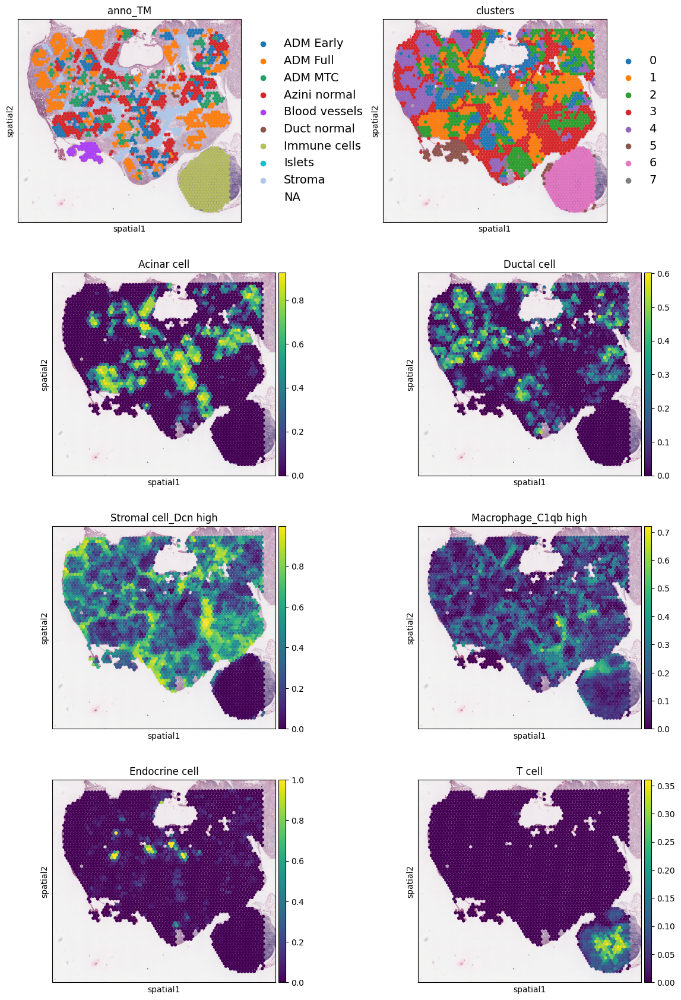

In [20]:
sc.pl.spatial(
    ad926983,
    img_key="hires",
    library_id="926983_hires",
    color=["anno_TM", "clusters", "Acinar cell", "Ductal cell", "Stromal cell_Dcn high" , "Macrophage_C1qb high", "Endocrine cell", "T cell"],
    size=1.5,
    ncols=2,
    legend_fontsize=14,
    save="scRNA_spatial_926983.pdf",
)

In [21]:
sc.pl.spatial(
    ad926983,
    img_key="hires",
    library_id="926983_hires",
    color=["anno_TM", "Stromal cell_Dcn high", "Acinar cell", "Ductal cell"]
    crop_coord=[3800, 13800, 12000, 22000],
    size=1.3,
    ncols=2,
    legend_fontsize=14,
    save="scRNA_spatial_926983_detail.pdf",
)

SyntaxError: invalid syntax. Perhaps you forgot a comma? (3426314976.py, line 5)

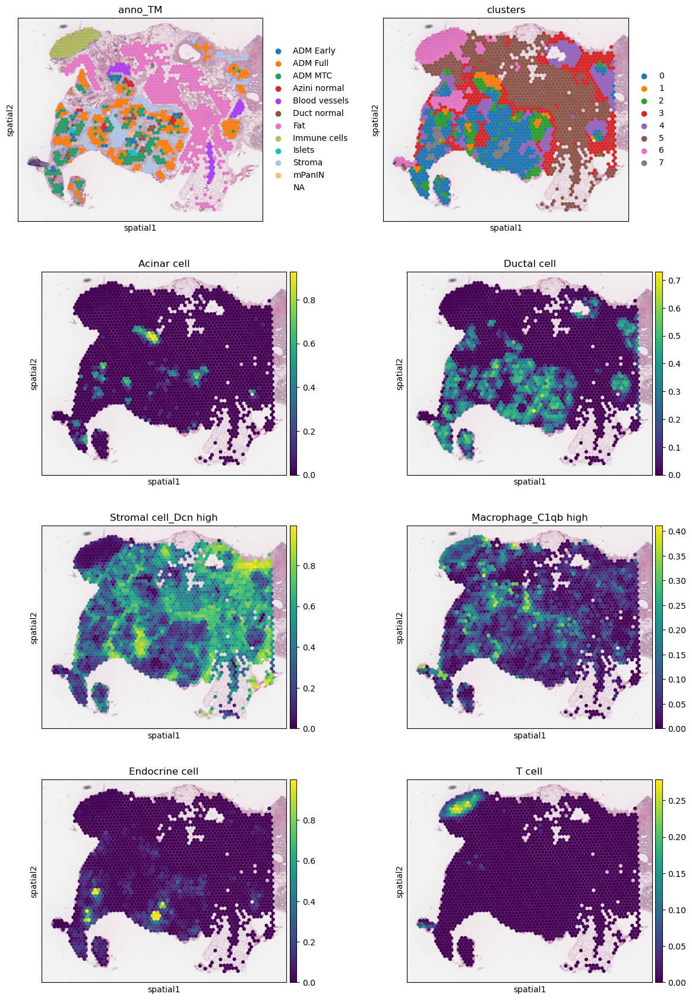

In [27]:
sc.pl.spatial(
    ad926987,
    img_key="hires",
    library_id="926987_hires",
    color=["anno_TM", "clusters", "Acinar cell", "Ductal cell", "Stromal cell_Dcn high" , "Macrophage_C1qb high", "Endocrine cell", "T cell"],
    size=1.5,
    ncols=2,
    save="scRNA_spatial_926987.pdf",
)

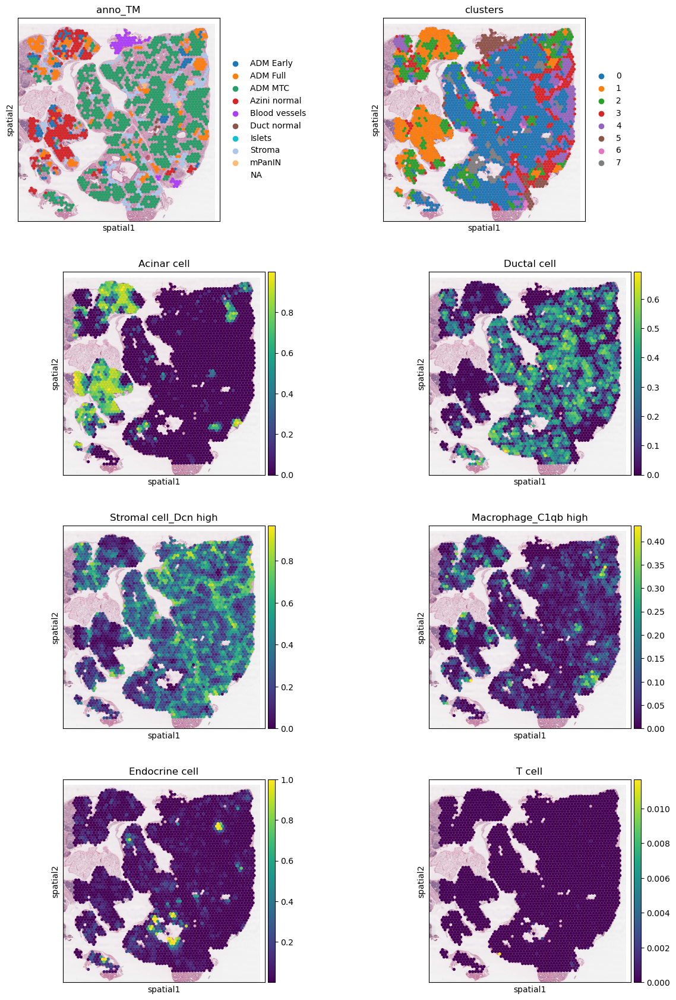

In [28]:
sc.pl.spatial(
    ad926991,
    img_key="hires",
    library_id="926991_hires",
    color=["anno_TM", "clusters", "Acinar cell", "Ductal cell", "Stromal cell_Dcn high" , "Macrophage_C1qb high", "Endocrine cell", "T cell"],
    size=1.5,
    ncols=2,
    save="scRNA_spatial_926991.pdf",
)

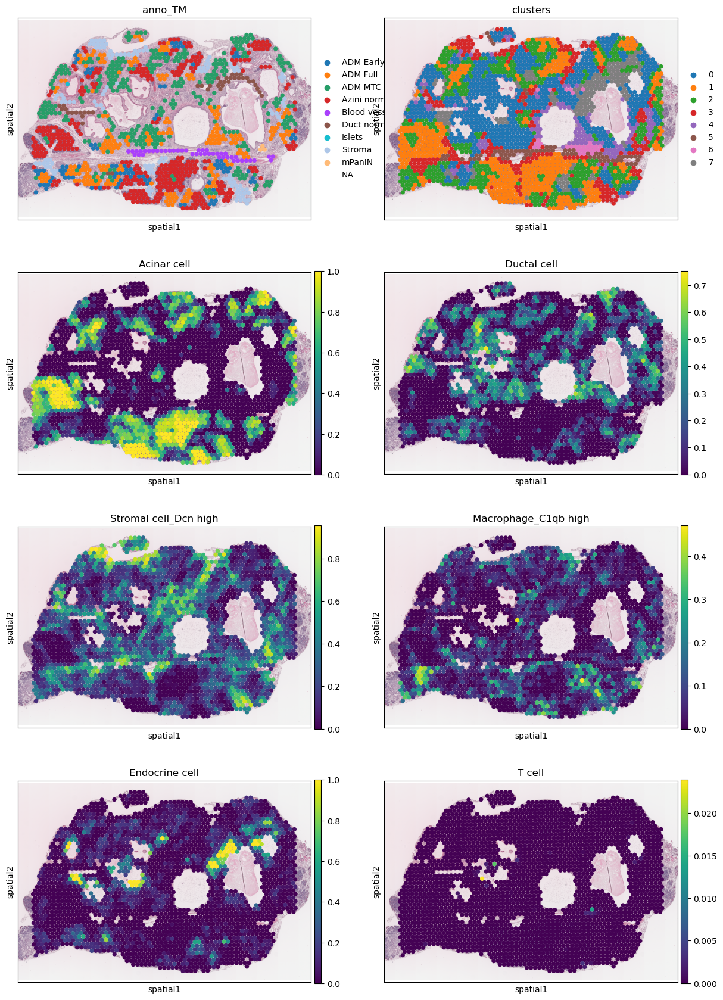

In [29]:
sc.pl.spatial(
    ad926895,
    img_key="hires",
    library_id="926895_hires",
    color=["anno_TM", "clusters", "Acinar cell", "Ductal cell", "Stromal cell_Dcn high" , "Macrophage_C1qb high", "Endocrine cell", "T cell"],
    size=1.5,
    ncols=2,
    save="scRNA_spatial_926895.pdf",
)

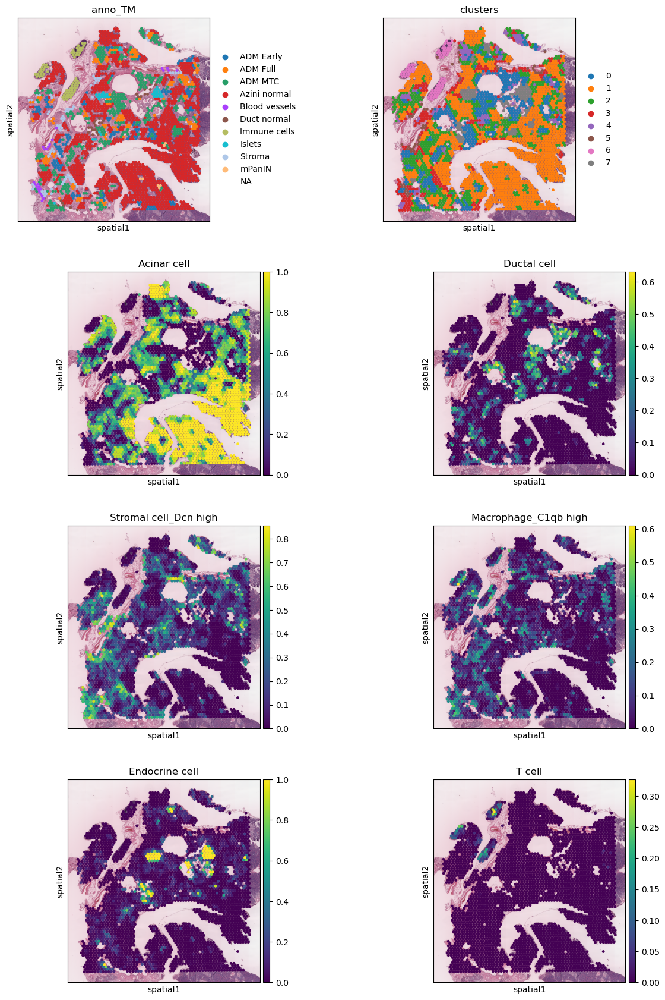

In [30]:
sc.pl.spatial(
    ad38032,
    img_key="hires",
    library_id="38032_hires",
    color=["anno_TM", "clusters", "Acinar cell", "Ductal cell", "Stromal cell_Dcn high" , "Macrophage_C1qb high", "Endocrine cell", "T cell"],
    size=1.5,
    ncols=2,
    save="scRNA_spatial_38032.pdf",
)